In [26]:
## Import Simulation Function Library
from RetinaOptLib import *
import dill
import matplotlib.pyplot as plt
%matplotlib notebook
plt.rcParams["figure.figsize"] = [16,9]

In [59]:
## For saving/loading notebook state

sessionTitle = "CellFullAnalysis_"+datetime.datetime.now().strftime("%m-%d-%y_%H-%M-%S")
dill.dump_session((sessionTitle))

#dill.load_session("CellFullAnalysis_08-25-19_16-55-30")


In [4]:
## load Dictionary Data stored in 'dict.mat'
# dict.mat is piece 2015-11-09-03,  Stixel 8, Eccentricity 20 deg

data = scipy.io.loadmat('dict.mat')
A   = pruneDecoder(data['stas'].T)
  # Select 20x20 slice of Pixels from A to fix border issues
P,eMap = pruneDict(data['dictionary'].T,data['ea'])

eLocs = data['elec_loc']  # electrode locations
numCells = A.shape[1]
dictLength = P.shape[1]
numPixels = A.shape[0]

# Trim A to a 20 x 20 Square
Aslice = np.zeros((400,A.shape[1]))
for col in np.arange(8,28):
#     A[30+80*col:50+80*col,:] = 0
    Aslice[(col-8)*20:(col-7)*20,:] = A[30+80*col:50+80*col,:]
    
A = pruneDecoder(Aslice)



In [5]:
### Image Loading & Preprocessing 
img = plt.imread("pic.jpg")
img = np.sum(img,2)/3

img = img / np.max(img) - .5

#img = genStixel(3000,1000,4)

# plt.imshow(img,cmap='bone')
# plt.axis('off')
# plt.show()

In [57]:
## Run Simulation
runSimulation = False 
runConvSim    = True
### Simulation Parameters
pixelDims = (20,20)  # Pixel Dimensions of Retinal STA 
numStims  = -1    # Number of Allowable stimulations
electrode = False  # Solve for Electrode-Dictionary Reconstruction or Optimal Cellular Activity
maxAct  = 100     # Maximum cell activity for time window
### Psychophysical Parameters
smps = 5.5              # Stimulus Monitor Pixel Size in micrometers
stixelSize = 8          # Stixel Size (number of monitor pixels per stimulus pixel)
eccentricity = 20       # Eccentricity from Fovea of Tissue Center
eyeDiam = 24            # Diameter of Eye in milimeters
objVisAng = (120,100)   # Size of VIsualField of View (degrees)
L  = 350                # L Luminance (cd/m2) of object
k = 3                   # Psychometric constant (minimum detection signal to noise ratio)
T = 100                 # Integration time of the eye (in msec)
Ng0 = 36000             # RGC Density at fovea (cells/deg^2)
eg  = 3                 # Subject-dependent  Cell Density Constant (deg)
# compute the  visual angle spanned by the electrode array 
elecVisAng = getElecAngs(smps,stixelSize, eyeDiam,pixelDims) 

# pupil diameter (mm)
# for now calculate as function of luminance, in future can be measured directly via eye tracking
pupilDiam  = 5 - 3 * np.tanh( .4*np.log(L*objVisAng[0]*objVisAng[1]/1600))
                             
psychParams = { # psychophysical parameters dictionary
    "L" : L,
    "XO": objVisAng[0], 
    "YO": objVisAng[1],
    "d" : pupilDiam,
    "e" : eccentricity,
    "elecXO" : elecVisAng[0],
    "elecYO" : elecVisAng[1],
    "binocular" : True,
    "k" : k,
    "T" : T/1000,
    "Ng0": Ng0,
    "eg" : eg
}

simParams = { # Stimulation Parameters Object
    "A" : A,
    "P" : P,
    "eMap" : eMap,
    "eLocs" : eLocs,
    "numCells" : numCells,
    "numPixels" : numPixels,  
    "pixelDims" : pixelDims,
    "numStims"  : numStims,
    "maxAct"  : maxAct
}
sDims = getSelectionDims(psychParams,img)

print('%i x %i degrees of visual angle is %i x %i pixels of the original image.'%(elecVisAng[0],elecVisAng[1],sDims[0],sDims[1]))

# Run the Simulation 
if runSimulation:
    imgData = preProcessImage(img, psychParams, simParams)
    (
      mseImgs, wmsImgs, ssmImgs,
      mseActs, wmsActs, ssmActs,
      mseRecons, wmsRecons, ssmRecons
    )  =  metricCompar(imgData,simParams,psychParams, electrode)
    
if runConvSim:
    imgData = preProcessImage(img,psychParams,simParams)
#     imgData.imgSet = imgData.imgSet[:,1:3]
#     imgData.xs = imgData.xs[1:3]
#     imgData.ys = imgData.ys[1:3]
#     imgData.numImgs  = 2
    stimSweepData = numStimSweep(imgData,simParams,psychParams,electrode)
        
        

2 x 2 degrees of visual angle is 34 x 34 pixels of the original image.
Tiling Image ...
Tiled Image
T: 1;  1/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:42<00:00, 40.49it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:08<00:00, 13.50it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:50<00:00,  3.55it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 2;  2/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:25<00:00, 68.88it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [01:56<00:00, 13.78it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:35<00:00,  6.30it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 4;  3/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|█████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:16<00:00, 102.42it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [01:56<00:00, 14.88it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:32<00:00,  4.86it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 10;  4/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|█████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 101.80it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [01:59<00:00, 14.48it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:30<00:00,  6.58it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 21;  5/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:23<00:00, 72.88it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:02<00:00, 13.46it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:23<00:00,  5.57it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 46;  6/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:23<00:00, 73.26it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:01<00:00, 14.16it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:14<00:00,  6.82it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 100;  7/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 99.08it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:04<00:00, 14.00it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:01<00:00,  7.19it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 215;  8/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:24<00:00, 72.33it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:05<00:00, 13.86it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:55<00:00,  7.38it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 464;  9/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 99.68it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:09<00:00, 12.53it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:48<00:00,  7.60it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 1000;  10/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:23<00:00, 68.30it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:09<00:00, 13.41it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:56<00:00,  7.35it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 2154;  11/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:27<00:00, 64.19it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:15<00:00, 12.81it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:51<00:00,  7.50it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 4641;  12/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 99.74it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:05<00:00, 13.85it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:54<00:00,  5.43it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 10000;  13/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:24<00:00, 71.18it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:12<00:00, 12.65it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [03:56<00:00,  7.97it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 21544;  14/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|█████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 101.65it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:17<00:00, 12.67it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:05<00:00,  8.50it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 46415;  15/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|█████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:17<00:00, 100.80it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:09<00:00, 12.48it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:07<00:00,  7.01it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete
T: 100000;  16/16
Solving for Cellular Activities...
MSE Activity Reconsruction:


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [00:24<00:00, 70.99it/s]


wMSE Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [02:10<00:00, 13.93it/s]


SSIM Activity Reconstruction


100%|██████████████████████████████████████████████████████████████████████████████| 1737/1737 [04:08<00:00,  6.00it/s]


Activities Solved. Rebuilding Images ...
Images rebuilt.
Simulation Complete


1) How does the choice of error metric change optimal cellular activity during linear reconstruction?
    
    a) Single Image Analysis:
        - Reconstructed Image Comparison: Is there a perceivable difference in reconstructed Image?
        - Activity: 
            i) Is there a difference in which cells are selected in terms of angle?
            ii) What are the total number of spikes required by each algo


    b) Multi-Image Analysis:
        - Activit|y:
            i) Display the optimal activity angle relative to MSE for wMSE and SSIM reconstructions
            ii) Histogram of total number of spikes required over all images for each metric


2) Distortion: How do the activities change when total spikes are limited? 

        a) Error Metric Analysis: For each metric, plot the error of each reconstruction versus num of allowed spikes averaged over all images
            i) Where do the metric diverge? What do the reconstructions look like? 


        b) Activity Analysis:  How different is distored activity from optimal in terms of angle betweee, n vectors? 
            i) Over each image reconstruction, calculate the anlge between distorted image activity and optimal activity
            ii) average over all images
            iii) plot numStims vs angle for each metric. Does one metric converge to optimal activity faster? 


3) Separability: Given a set of cell activities can we separate them into clusters that predict the error metric used?
       
       a) For each metric, stack the cell activity vectors for thatac metrics into the same matrix and perform pca
       
       b) Plot each data point/image with color specifying metric (maybe compare to random). See if linearly separable. 



As many of you know I'm exploring how different image  error metrics impact device electrode stimulation and image reconstruction. Currently, we use greedy optimization of the  mean-square error (MSE). This measures the energy of the difference signal (if A is true N-pixel. image  and B is reconstruction, then MSE(A-B) = (1/N)* ||A-B||**2.

We're considering 2 other error metrics as well:
 1) w-MSE, a weighted version of MSE where the error signal is transformed into the frequency domain (via DCT). The frequency coefficients are then weighted by the Contrast Sensitivity Function (CSF) which is a psychophysical measurement of spatial frequency sensitivity widely used in vision literature. The w-MSE is then the energy of the weighted DCT coefficients.


2) SSIM, the Structural Similarity Index that combines 3 components to measure image similiarity: luminance (mean intensity), contrast (standard deviation of intensity), and structure (cross-correlation of intensity between images A and B). Currently, SSIM is a widely used image quality assessment metric.

First I've looked at the optimal cellular activity. This assumes that we have  arbitrary spatiotemporal control of cellular activity. This means that any differences we observe in celluar activity are independent of the engineering constraints (dictionary-electrode stimulation etc.), and solely the result of the linear decoder from the retinal data and the error metric being optimized.  I've run a simulation with the following parameters:

Visual Scene:
    - 120 deg x 100 deg Field of View
    - Monocular vision (one electrode in one eye)
    - Sampled at 1080p resolution
Reconstruction:
    -  Periphery  Retinal Data (20 degrees eccentricity)
    -  Piece 2015-11-09-03
    -  20 x 20 stixels with stixel size 8 covering                            ~ 2 x 2 degrees of visual field

Does the linearly reconstructed image perceivably change? Here's one image covering 2x2 degrees of the visual field reconstructed according to the 3 different metrics:

<IPython.core.display.Javascript object>


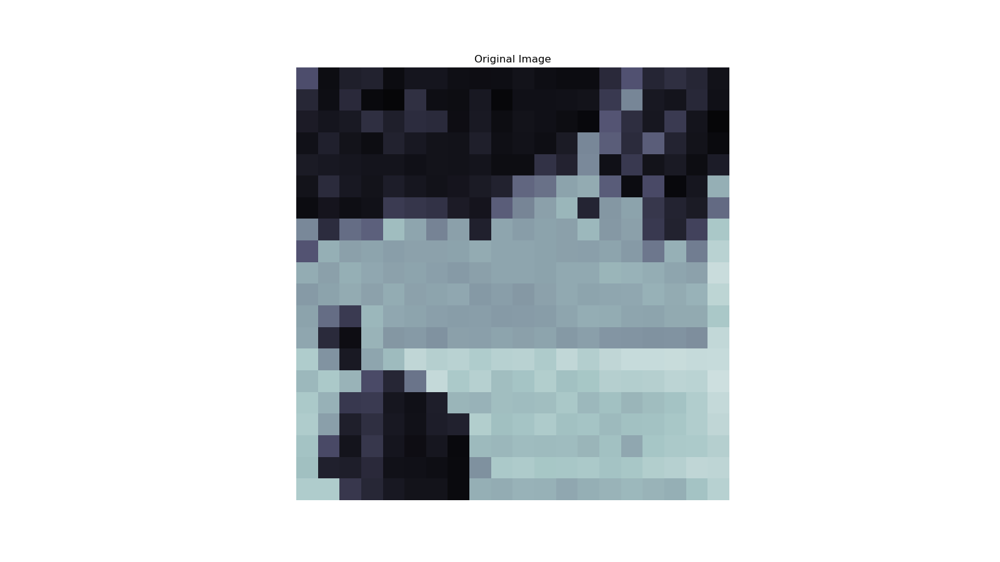

<IPython.core.display.Javascript object>


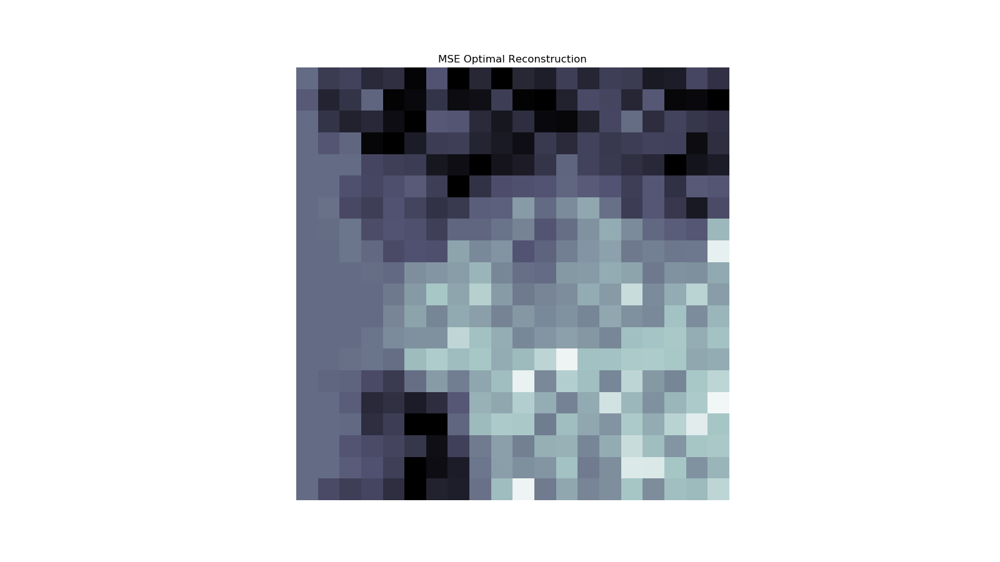

<IPython.core.display.Javascript object>


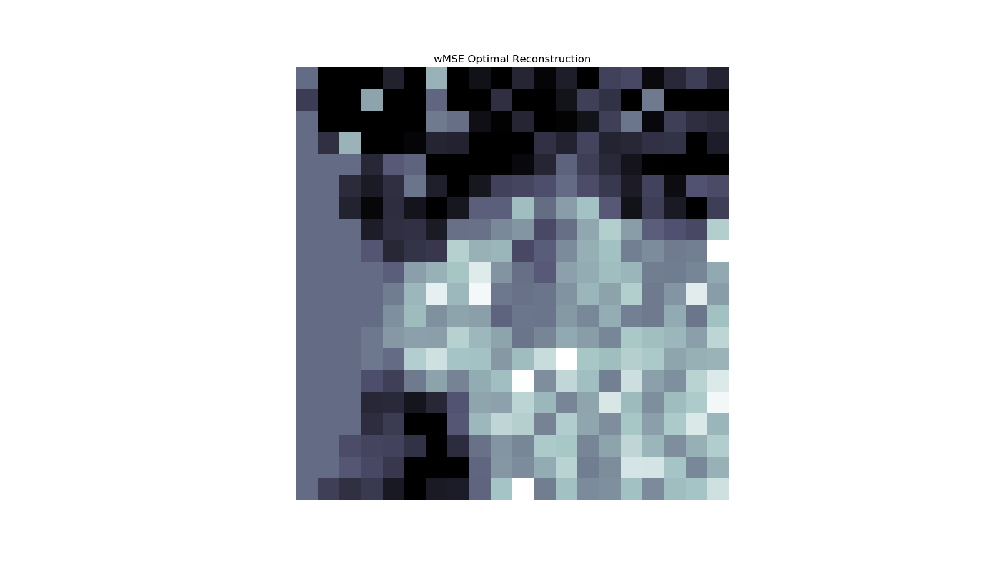

<IPython.core.display.Javascript object>


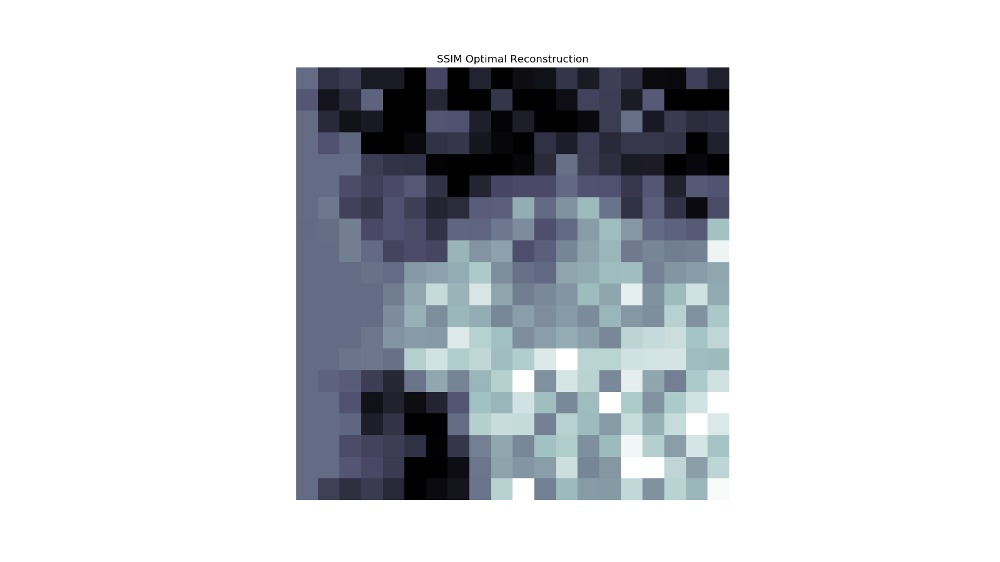

In [14]:
## single image comparison

Tidx = 15
imgNum = 980

origIm = np.reshape(imgData.imgSet[:,imgNum],pixelDims,order='F')
mseRec = np.reshape(mseImgs[:,imgNum],pixelDims,order='F')
wmsRec = np.reshape(wmsImgs[:,imgNum],pixelDims,order='F')
ssmRec = np.reshape(ssmImgs[:,imgNum],pixelDims,order='F')

plt.figure()
plt.imshow(origIm,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title("Original Image")
plt.savefig('Original.jpg',bbox_inches='tight')
plt.show()

plt.figure()
plt.imshow(mseRec,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title("MSE Optimal Reconstruction")
plt.savefig('MSERecons.jpg',bbox_inches='tight')


plt.figure()
plt.imshow(wmsRec,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title("wMSE Optimal Reconstruction")
plt.savefig('wMSRecons.jpg',bbox_inches='tight')


plt.figure()
plt.imshow(ssmRec,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title("SSIM Optimal Reconstruction")
plt.savefig('SSMRecons.jpg',bbox_inches='tight')



The noticable difference is the contrast between the black and white portions of the image. In particular, MSE < SSIM < wMSE.  While subtle in a single image, we can tile together the entire visual scene using these reconstructed images and the effect becomes clearer. This tiling is analogous to making several saccades across the visual scene. The point is, the error metrics clearly alter the image as we integrate over the entire visual scene in time and space. As for which reconstruction is preferable, that is decidable by behavioral testing. 

<IPython.core.display.Javascript object>


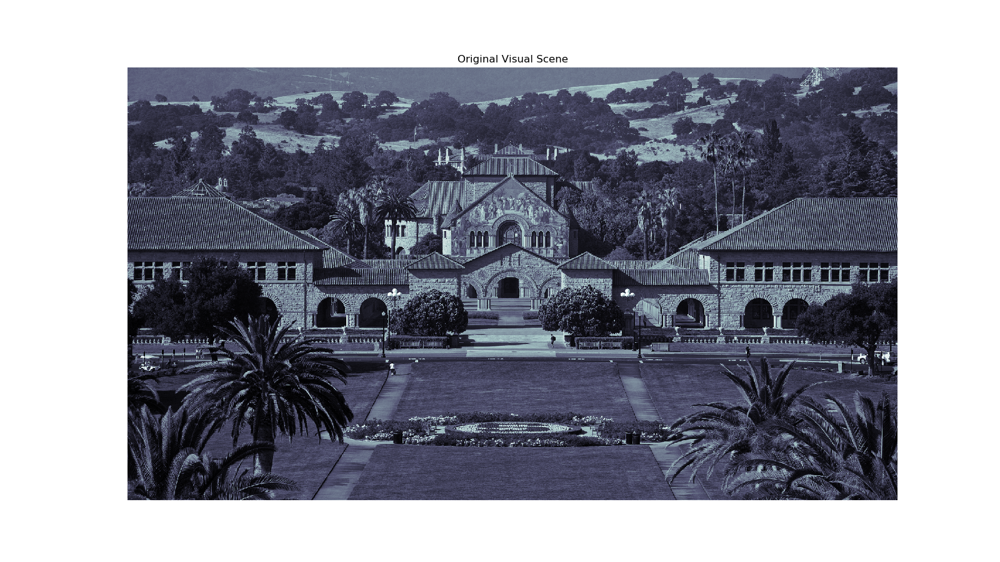

<IPython.core.display.Javascript object>


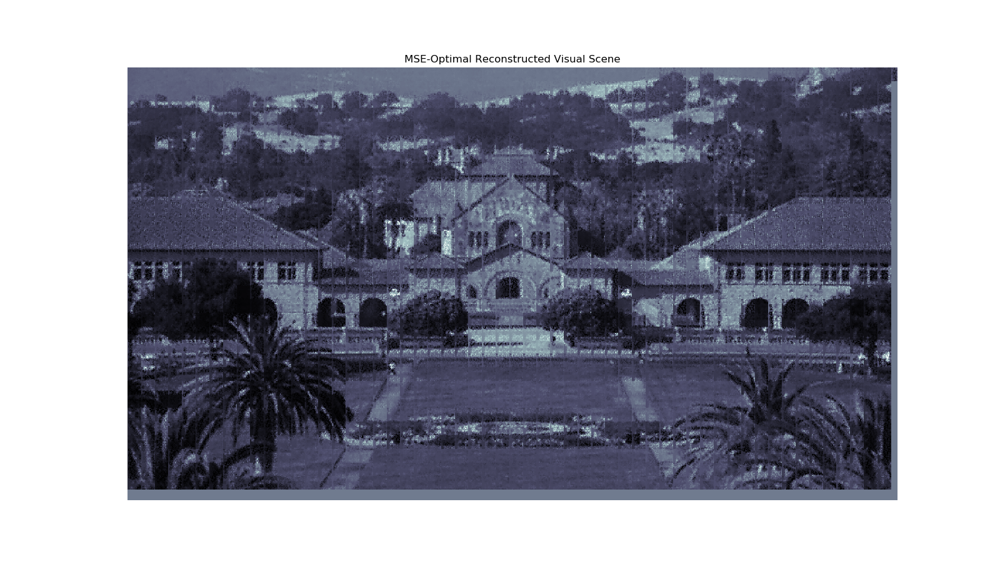

<IPython.core.display.Javascript object>


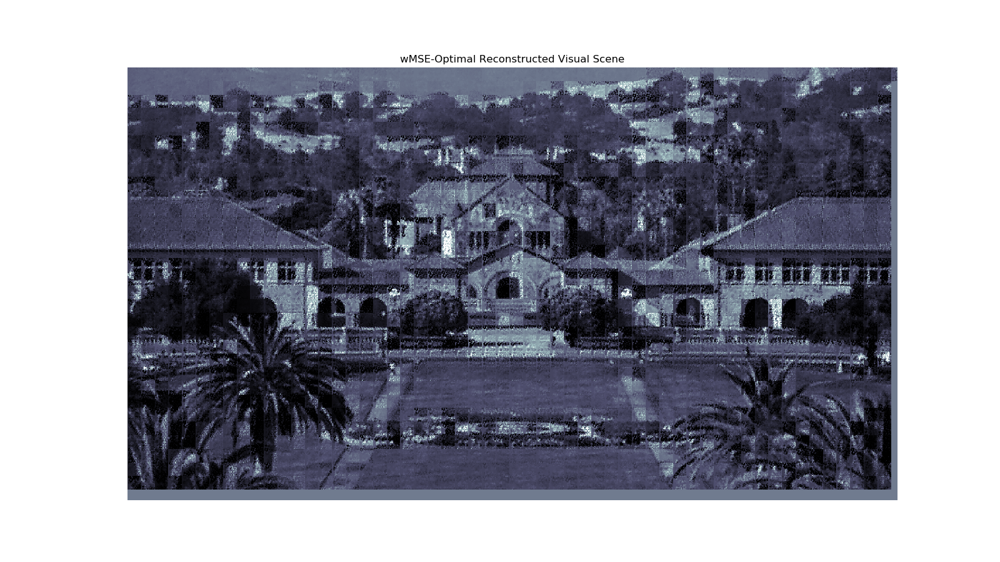

<IPython.core.display.Javascript object>


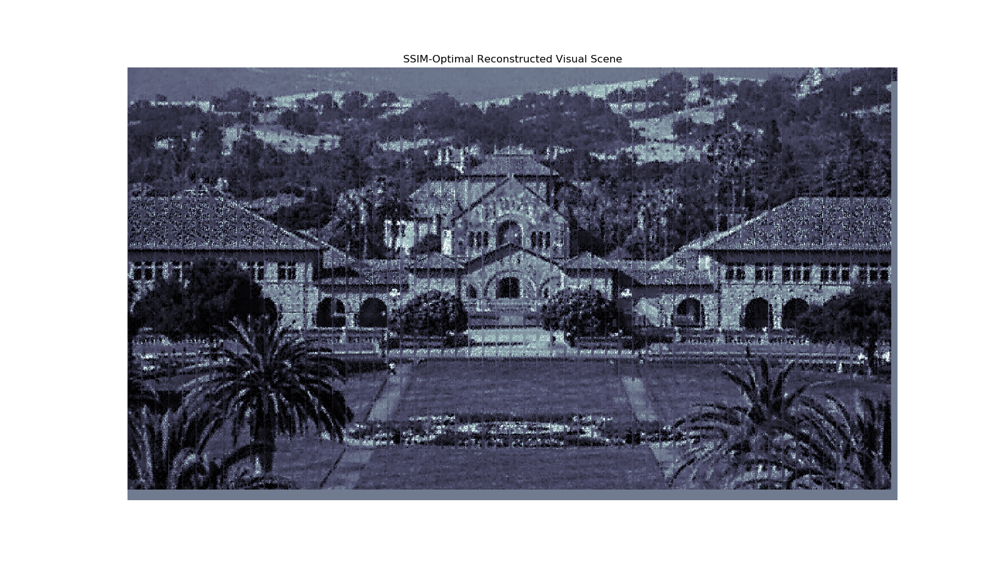

In [15]:
## display entire visual scene tiled by reconstructions for each error metric
plt.figure()
plt.imshow(imgData.origImg,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title('Original Visual Scene')
plt.savefig('OrigVisScene.jpg',bbox_inches='tight')
plt.show()

plt.figure()
plt.imshow(mseRecons,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title('MSE-Optimal Reconstructed Visual Scene')
plt.savefig('MSEVisScene.jpg',bbox_inches='tight')

plt.figure()
plt.imshow(wmsRecons,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title('wMSE-Optimal Reconstructed Visual Scene')
plt.savefig('wMSVisScene.jpg',bbox_inches='tight')

plt.figure()
plt.imshow(ssmRecons,cmap='bone',vmax=.5,vmin=-.5)
plt.axis('off')
plt.title('SSIM-Optimal Reconstructed Visual Scene')
plt.savefig('SSMVisScene.jpg',bbox_inches='tight')

Turning back to the single image the cell activity for each metric is plotted below. While the curves generally follow the same trajectory, there are notable differences in the magnitude of activity for several cells (e.g. cell 38). We also have that the total number of spikes varies significantly (up to 40% relative to MSE): MSE < SSIM < wMSE. This variation in total number of spikes coincides with the difference in contrast between the images.

<IPython.core.display.Javascript object>


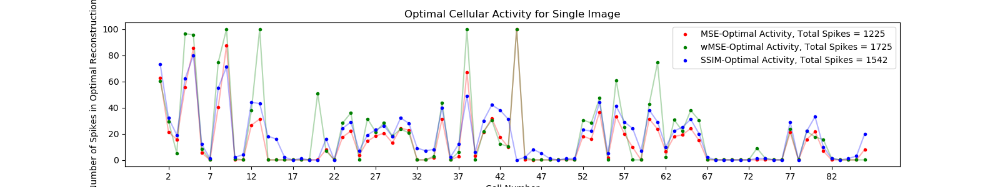

In [54]:
## single image cellular activity comparison
plt.figure(figsize= (16,3))
cellNums = np.arange(mseActs[:,imgNum].size) + 1
plt.plot(cellNums,mseActs[:,imgNum],'-',c='r',alpha=.3)
plt.plot(cellNums,wmsActs[:,imgNum],'-',c='g',alpha=.3)
plt.plot(cellNums,ssmActs[:,imgNum],'-',c='b',alpha=.3)
plt.plot(cellNums,mseActs[:,imgNum],'.',c='r',label='MSE-Optimal Activity, Total Spikes = %i'%np.sum(mseActs[:,imgNum]))
plt.plot(cellNums,wmsActs[:,imgNum],'.',c='g',label='wMSE-Optimal Activity, Total Spikes = %i'%np.sum(wmsActs[:,imgNum]))
plt.plot(cellNums,ssmActs[:,imgNum],'.',c='b',label='SSIM-Optimal Activity, Total Spikes = %i'%np.sum(ssmActs[:,imgNum]))
plt.xlabel('Cell Number')
plt.xticks(np.arange(min(cellNums), max(cellNums), 5)+1)
plt.ylabel('Number of Spikes in Optimal Reconstruction')
plt.title('Optimal Cellular Activity for Single Image')
plt.legend()
plt.savefig('SingleImageCellActComp.jpg',bbox_inches='tight')




Repeating this analysis over the set of all images tiled in the visual scene, I've plotted the angle of the optimal cellular activities for wMSE and SSIM relative to MSE-optimal. The magnitude is the total number of spikes for a given wMSE(or SSIM) image reconstruction minus the total number spikes in a MSE image reconstruction. Blue points are where the MSE-optimal reconstruction has more total spikes than wMSE (or SSIM) optimal reconstructions.  

Furthermore, I've plotted histograms for the total number of stimulations over the image set for each metric. Over the set of ~1700 images, we see that MSE gives an average of ~500 spikes on average for an image reconstruction and the wMSE and SSIM metrics give ~830 and ~800 spikes on average respectively. The vertical lines indicate the averages on the histograms. 

These plots together indicate that when reconstructing images using wMSE and SSIM error metrics, the optimal cellular activity require many more spikes (between 50% and 60% averaged over the visual scene). Supposing that these metrics lead to improved perceptual similarity, there is a clear trade-off between improving perceptual quality one one hand, and reducing the number of spikes needed to reconstruct an image.  

<IPython.core.display.Javascript object>


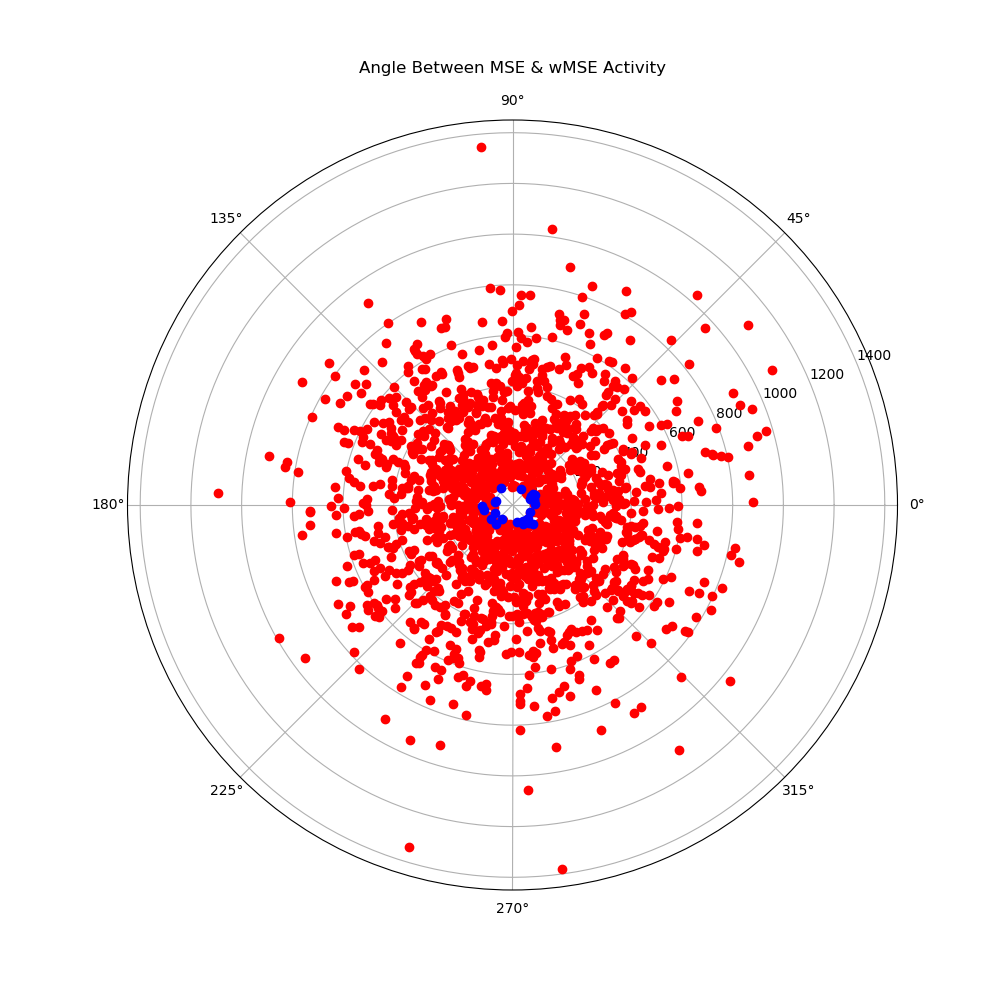

<IPython.core.display.Javascript object>


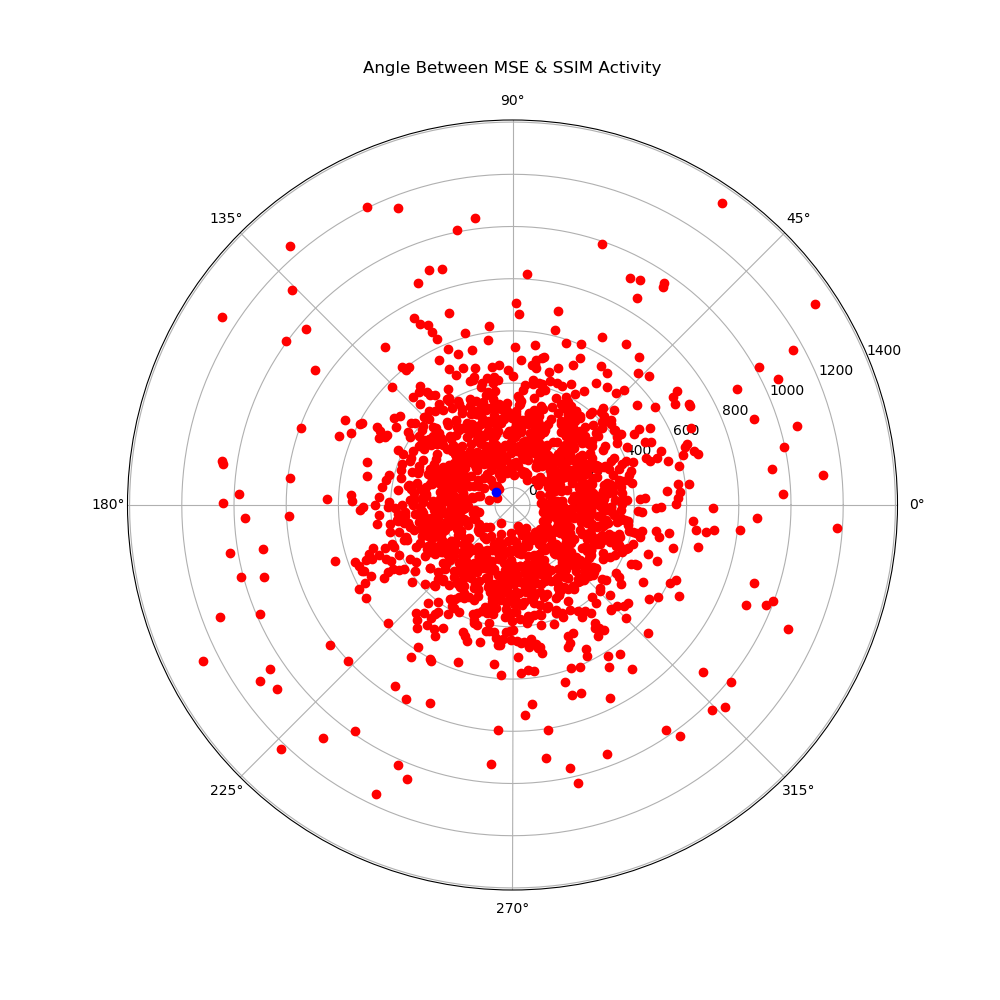

In [53]:
#radial plot of image reconstructions 
plt.figure(figsize=(10,10))
actAnglePlot(mseActs,wmsActs,'wMSE')
plt.savefig('mseVSwmsAng.jpg',bbox_inches='tight')

plt.figure(figsize=(10,10))
actAnglePlot(mseActs,ssmActs,'SSIM')
plt.savefig('mseVSssmAng.jpg',bbox_inches='tight')

<IPython.core.display.Javascript object>


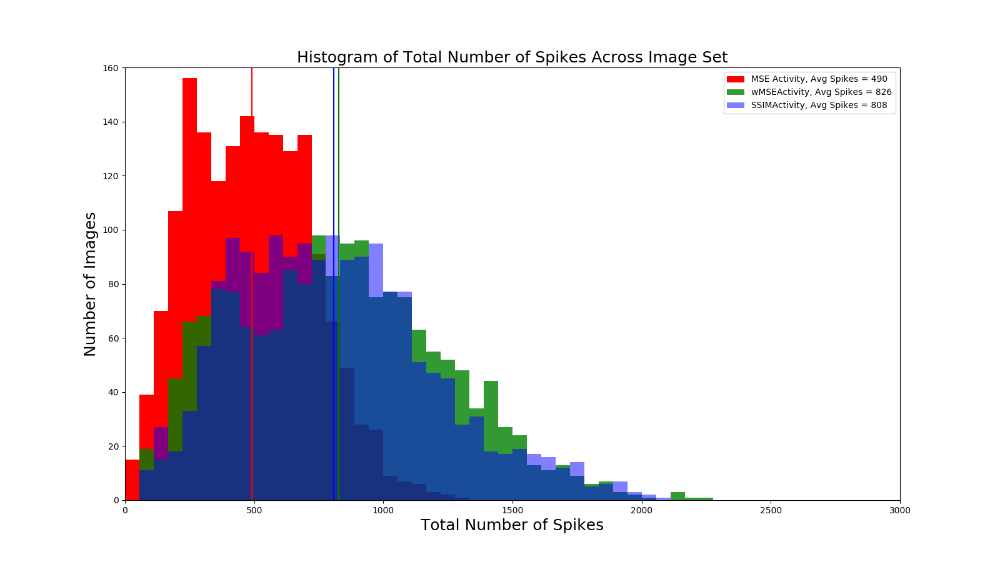

In [56]:
# cell activity  histogram

plt.figure(figsize=(16,9))
actHist(mseActs,"MSE",1)
actHist(wmsActs,"wMSE",.8)
actHist(ssmActs,"SSIM",.5)
plt.xlim([0,3000])
plt.ylim([0, 160])
plt.savefig('CellActHistogram.jpg',bbox_inches='tight')

So far these results assume no limit on the number of spikes (stimulations) permitted. To address this, I've  repeated this simulation but constrained solutions to limit the number of spikes to values logarithmically spaced between $10^0$ and $10^5$. These limits introduce distortion into the reconstructed images. To quantify these distortions, I've measured the relative error of the MSE, wMSE, and SSIM reconstructed images to the given reference image. The relative error is defined as Error(A,B) / Error(A, 0),  so for example for MSE,  relative error_MSE = $||A-B||^2 $ / $||A||^2$. This relative error is a unitless measure that is nonnegative and zero when the two images compared are equal. Each curve is averaged over the set of ~1,700 images and the vertical bars represent standard error of the mean. 







In [60]:
plotStimCompar(imgData, stimSweepData, "mse", psychParams, (20,20))
#plotStimCompar(imgData, stimSweepData, "wms", psychParams, (20,20))
#plotStimCompar(imgData, stimSweepData, "ssm", psychParams, (20,20))
